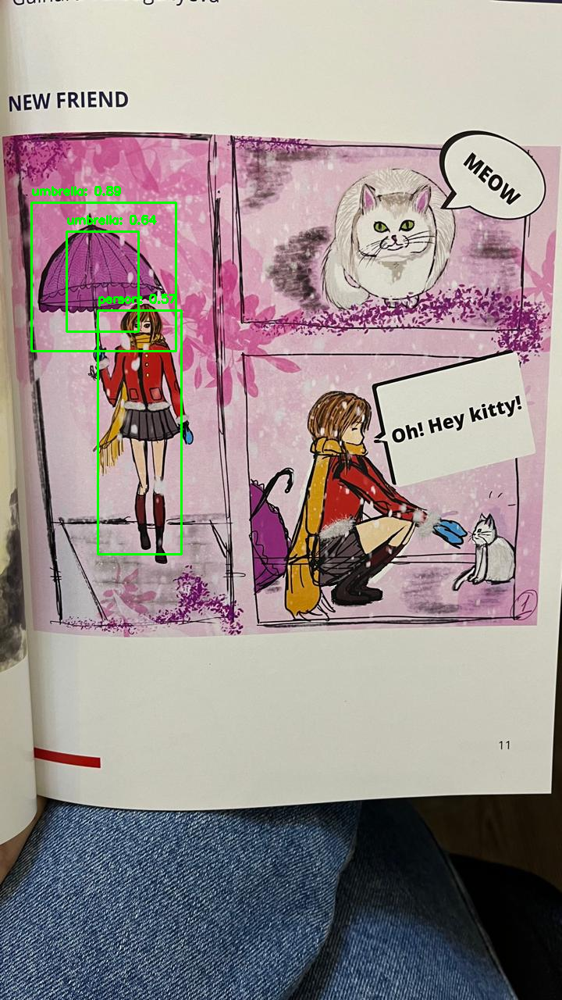

In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# Установка wget, если он отсутствует
os.system("pip install wget")
import wget

# Загрузка файлов YOLO
wget.download("https://pjreddie.com/media/files/yolov3-tiny.weights", "yolov3-tiny.weights")
wget.download("https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3-tiny.cfg", "yolov3-tiny.cfg")
wget.download("https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names", "coco.names")

# Загрузка предварительно обученной модели YOLO
net = cv2.dnn.readNet("yolov3-tiny.weights", "yolov3-tiny.cfg")
layer_names = net.getLayerNames()
out_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

# Загрузка классов
with open("coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Путь к изображению в Google Colab
image_path = "/content/ғ.jpg"
image = cv2.imread(image_path)
h, w = image.shape[:2]

# Подготовка изображения для YOLO
blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
net.setInput(blob)
outs = net.forward(out_layers)

# Обработка результатов
boxes, confidences, class_ids = [], [], []
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.3:
            center_x, center_y, width, height = (detection[:4] * np.array([w, h, w, h])).astype("int")
            x, y = int(center_x - width / 2), int(center_y - height / 2)
            boxes.append([x, y, int(width), int(height)])
            confidences.append(float(confidence))
            class_ids.append(class_id)

# Применение NMS для удаления дублирующихся рамок
indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
if isinstance(indices, tuple):
    indices = []  # Исправление ошибки, если NMSBoxes возвращает пустой кортеж
else:
    indices = indices.flatten()

for i in indices:
    x, y, w, h = boxes[i]
    label = f"{classes[class_ids[i]]}: {confidences[i]:.2f}"
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Отображение результата в Google Colab
cv2_imshow(image)

In [19]:
# install YOLOv8
!pip install ultralytics

# import libraries
from ultralytics import YOLO
import cv2
import torch
from google.colab.patches import cv2_imshow


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"use {device}")
model = YOLO("yolov8n.pt").to(device)

use cpu


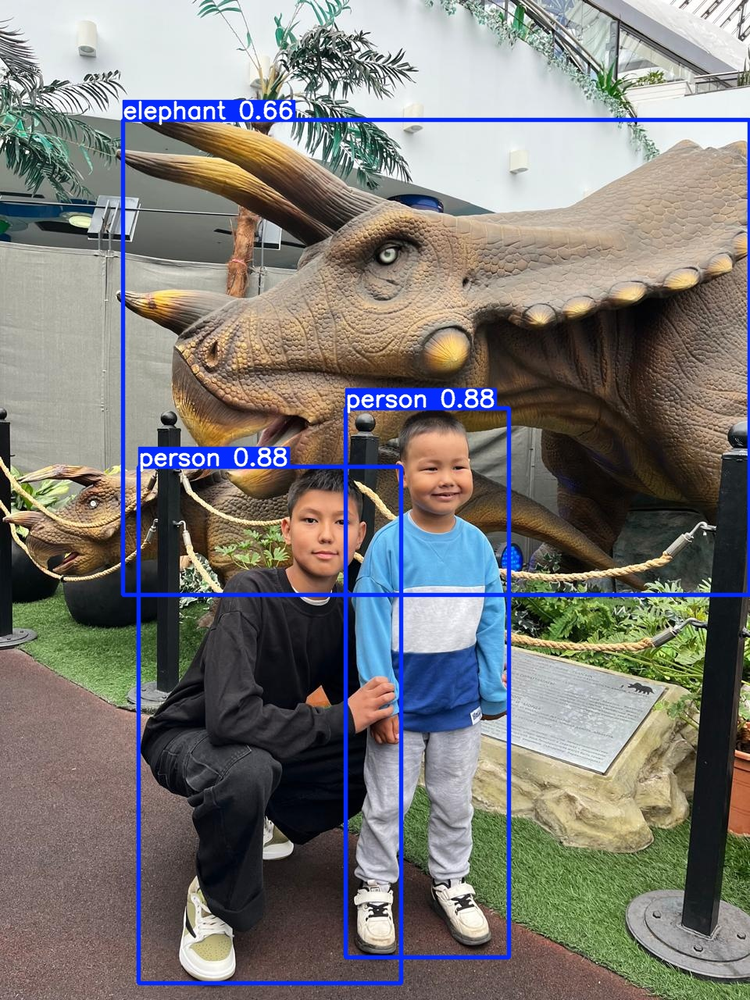

In [23]:
from google.colab.patches import cv2_imshow

results[0].save(filename="/content/1.jpg")

img = cv2.imread("/content/1.jpg")
cv2_imshow(img)



0: 640x480 1 person, 2 bottles, 1 cup, 1 oven, 182.3ms
Speed: 3.5ms preprocess, 182.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


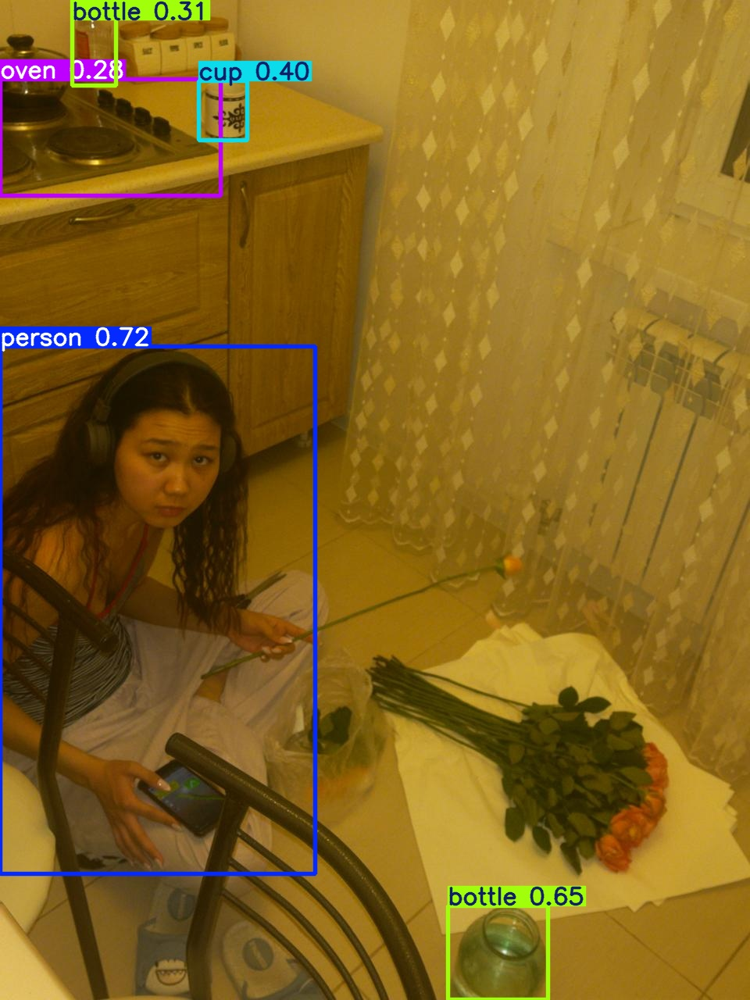


0: 640x480 1 person, 2 cats, 1 suitcase, 268.3ms
Speed: 4.0ms preprocess, 268.3ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 480)


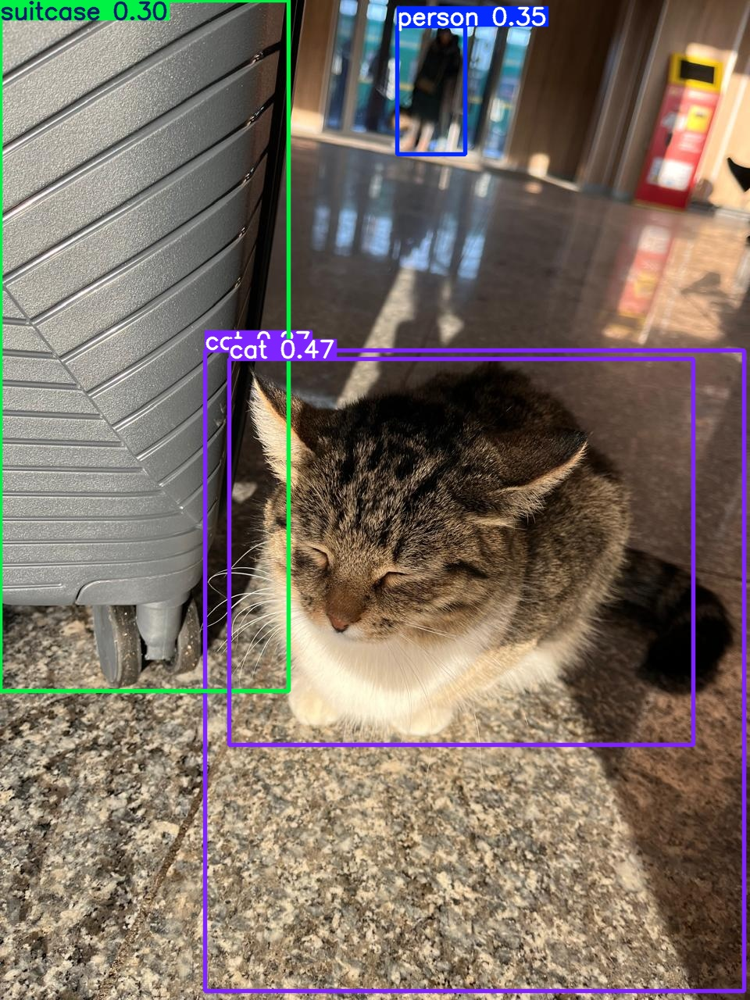


0: 640x480 1 person, 2 cows, 270.1ms
Speed: 4.2ms preprocess, 270.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


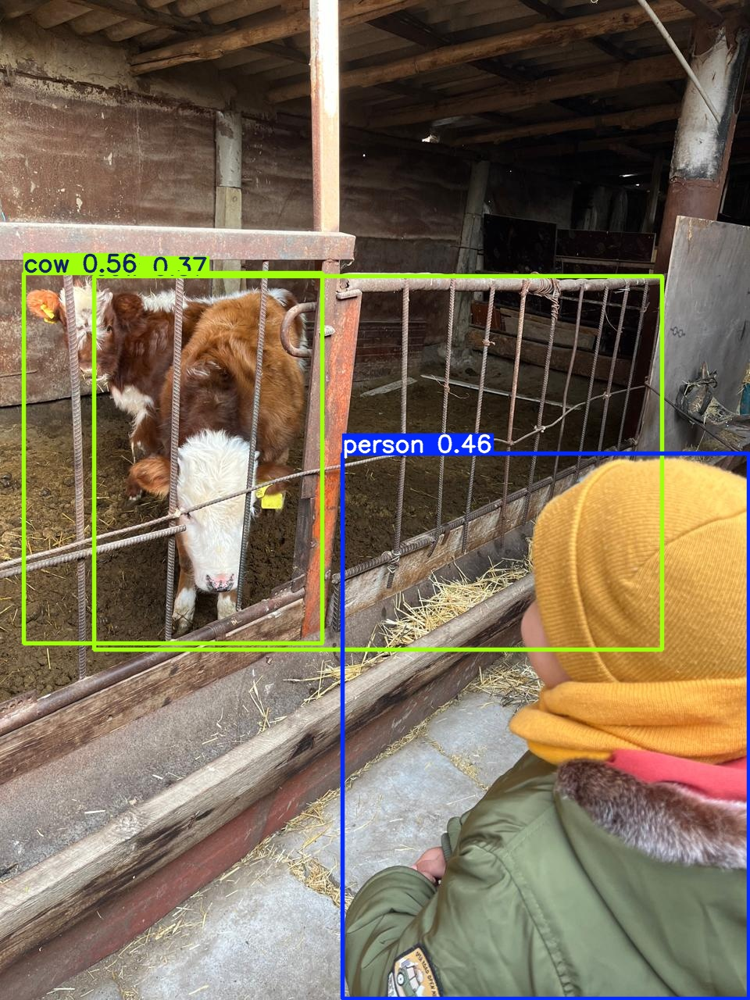

In [26]:
from google.colab.patches import cv2_imshow
import cv2
image_paths = ["/content/3.jpg", "/content/7.jpg", "/content/4.jpg"]
for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)
    results = model(image)
    save_path = f"/content/result_{i+1}.jpg"
    results[0].save(filename=save_path)
    img = cv2.imread(save_path)
    cv2_imshow(img)


use cpu

image 1/1 /content/1.jpg: 640x480 2 persons, 1 elephant, 200.6ms
Speed: 3.7ms preprocess, 200.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


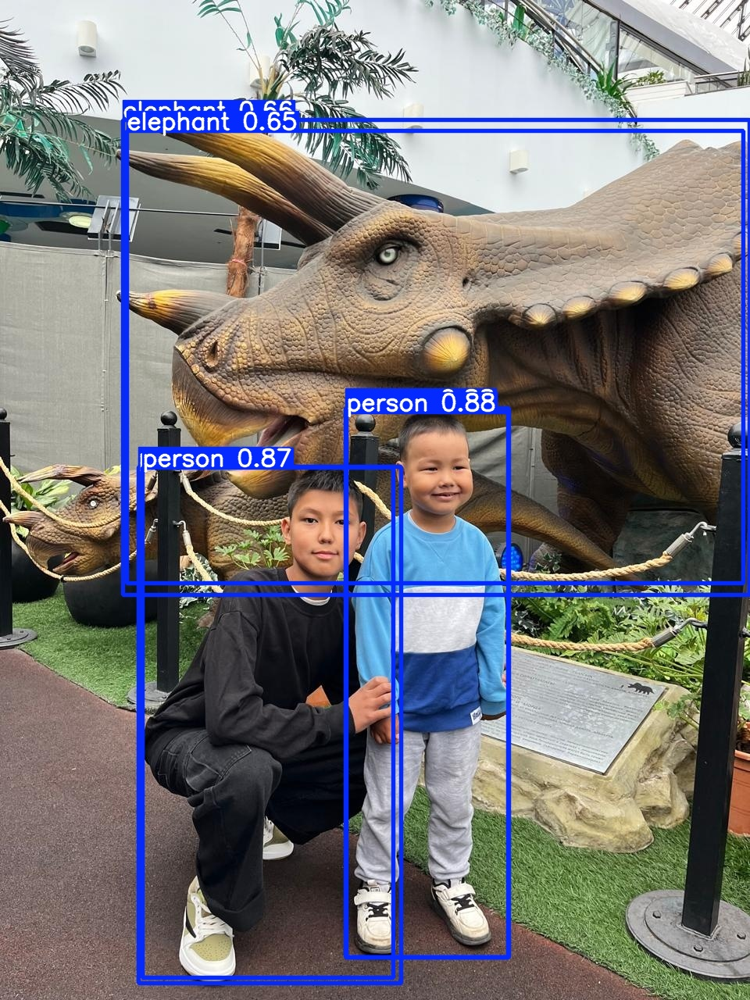

In [28]:
# install YOLOv8
!pip install ultralytics

# import libraries
from ultralytics import YOLO
import cv2
import torch
from google.colab.patches import cv2_imshow

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"use {device}")

# model yolo8
model = YOLO("yolov8n.pt").to(device)

results = model("/content/1.jpg")
results[0].save(filename="/content/1.jpg")

img = cv2.imread("/content/1.jpg")
cv2_imshow(img)
